In [1]:
import os
import xarray as xr
from helpers.local_setup import _setup
_setup()
import utils.external.pygmtsar as pygmtsar
import rioxarray as riox
from libs.internal.sbas.sbas_process import SbasProcess
from libs.internal.sbas.utils import shift_minor_modes

In [2]:
config_path = '/Users/raf/Dev/code/msg2sar/data/configs/sar/sbas/desc/2023/bogo_pl_test.json'
sbas_pipe = SbasProcess(config_path)

2026-02-16 00:13:07 - INFO - SBAS-CONFIG initialized with: 
 AOI-{'type': 'Feature', 'properties': {'id': 1, 'aoiName': 'bogo_pl'}, 'geometry': {'type': 'MultiPolygon', 'coordinates': [[[[20.64924353407008, 52.66160342607914], [21.848247196645833, 52.54707896324363], [21.83294055248267, 52.38682741559186], [20.633936889906916, 52.50135187842737], [20.64924353407008, 52.66160342607914]]]]}} 
REFERENCE-2023-02-19 
DOWNLOAD_DIR-/Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download 
PROCESS_DIR-/Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/process 
DEM_PATH-/Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download/dem.nc 



In [3]:
from libs.external.pygmtsar.IO import IO

In [4]:
# sbas_pipe.run_process(sbas_pipe.trend)

In [5]:
sbas_pipe.run_process(sbas_pipe.displacement)

2026-02-16 00:13:18 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-16 00:13:19 - INFO - DASK client is running


Scan data directory for S1 scenes: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download
Initialize S1 Stack with working directory: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/process
Load DEM from /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download/dem.nc


/Users/raf/Dev/code/msg2sar/utils/external/pygmtsar/Stack_dem.py:68: UserWarning: The specified chunks separate the stored chunks along dimension "y" starting at index 512. This could degrade performance. Instead, consider rechunking after loading.
  geoid = xr.open_dataarray(geoid_filename, engine=self.netcdf_engine, chunks=self.netcdf_chunksize).rename({'y': 'lat', 'x': 'lon'})
/Users/raf/Dev/code/msg2sar/utils/external/pygmtsar/Stack_dem.py:68: UserWarning: The specified chunks separate the stored chunks along dimension "x" starting at index 512. This could degrade performance. Instead, consider rechunking after loading.
  geoid = xr.open_dataarray(geoid_filename, engine=self.netcdf_engine, chunks=self.netcdf_chunksize).rename({'y': 'lat', 'x': 'lon'})


Save DEM on WGS84 Ellipsoid:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

2026-02-16 00:13:19 - INFO - SBAS-STACK initialized
2026-02-16 00:13:19 - INFO - Loading data
2026-02-16 00:13:19 - INFO - Closing DASK client
2026-02-16 00:13:19,924 - distributed.scheduler - ERROR - 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/msg2sar/lib/python3.12/site-packages/distributed/utils.py", line 832, in wrapper
    return await func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/envs/msg2sar/lib/python3.12/site-packages/distributed/scheduler.py", line 7578, in feed
    await asyncio.sleep(interval)
  File "/opt/anaconda3/envs/msg2sar/lib/python3.12/asyncio/tasks.py", line 665, in sleep
    return await future
           ^^^^^^^^^^^^
asyncio.exceptions.CancelledError
2026-02-16 00:13:19 - INFO - DASK client closed
2026-02-16 00:13:19 - INFO - DASK client already closed
2026-02-16 00:13:19 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-16 00:13:20 - INFO - DASK client is running
2026-02-16 00:13

Note: data chunk size (inf, inf) is too large for stack processing
Note: auto tune data chunk size to a half of NetCDF chunk: (256, 256)


Saving NetCDF 2D/3D Dataset:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

2026-02-16 00:15:50 - INFO - Cleaning
2026-02-16 00:15:50 - INFO - Closing DASK client
2026-02-16 00:15:50 - INFO - DASK client closed


In [6]:
sbas_pipe.dask_manager.start_client()
sbas_data = sbas_pipe.spec.get_stack(add_dem=True)
sbas_pipe.dask_manager.close_client()

2026-02-16 00:15:57 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-16 00:15:57 - INFO - DASK client is running


Scan data directory for S1 scenes: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download
Initialize S1 Stack with working directory: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/process
Load DEM from /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download/dem.nc


Save DEM on WGS84 Ellipsoid:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

2026-02-16 00:15:58 - INFO - SBAS-STACK initialized
2026-02-16 00:15:58 - INFO - Closing DASK client
2026-02-16 00:15:58,183 - distributed.scheduler - ERROR - 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/msg2sar/lib/python3.12/site-packages/distributed/utils.py", line 832, in wrapper
    return await func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/envs/msg2sar/lib/python3.12/site-packages/distributed/scheduler.py", line 7578, in feed
    await asyncio.sleep(interval)
  File "/opt/anaconda3/envs/msg2sar/lib/python3.12/asyncio/tasks.py", line 665, in sleep
    return await future
           ^^^^^^^^^^^^
asyncio.exceptions.CancelledError
2026-02-16 00:15:58 - INFO - DASK client closed


In [9]:
t_r = sbas_pipe.spec.spec.get("trend_resolution", sbas_pipe.trend_resolution)

In [21]:
unwrap_sbas_c.conncomp

<xarray.DataArray 'conncomp' (pair: 20, y: 1468, x: 6369)> Size: 748MB
dask.array<xarray-conncomp, shape=(20, 1468, 6369), dtype=float32, chunksize=(1, 1468, 2048), chunktype=numpy.ndarray>
Coordinates:
    ref      (pair) datetime64[ns] 160B dask.array<chunksize=(1,), meta=np.ndarray>
    rep      (pair) datetime64[ns] 160B dask.array<chunksize=(1,), meta=np.ndarray>
  * pair     (pair) <U21 2kB '2023-01-02 2023-01-14' ... '2023-04-08 2023-04-20'
  * y        (y) float64 12kB 0.5 1.5 2.5 3.5 ... 1.466e+03 1.466e+03 1.468e+03
  * x        (x) float64 51kB 2.0 6.0 10.0 ... 2.547e+04 2.547e+04 2.547e+04

In [10]:
sbas_corr_path = sbas_pipe.config.sbas_corr_path
sbas_uwrapped_impr_path = sbas_pipe.config.sbas_uwrapped_impr_path
sbas_trend_path = sbas_pipe.config.sbas_trend_path
corr_sbas = sbas_pipe.open_cube_data(sbas_corr_path)
unwrap_sbas_c = sbas_pipe.open_cube_data(sbas_uwrapped_impr_path)

# Function to find the mode (most frequent value)
unwrap_sbas_m = sbas_data.conncomp_main(unwrap_sbas_c, 1)
# Trend estimation
decimator_sbas = sbas_data.decimator(resolution=t_r, grid=(1,1))
topo = decimator_sbas(sbas_data.get_topo())
yy, xx = xr.broadcast(topo.y, topo.x)

2026-02-15 23:58:44 - INFO - Closing DASK client
2026-02-15 23:58:44 - INFO - DASK client closed
2026-02-15 23:58:44 - INFO - DASK client already closed
2026-02-15 23:58:44 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-15 23:58:45 - INFO - DASK client is running
2026-02-15 23:58:45 - INFO - Closing DASK client
2026-02-15 23:58:45 - INFO - DASK client closed
2026-02-15 23:58:45 - INFO - DASK client already closed
2026-02-15 23:58:45 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-15 23:58:45 - INFO - DASK client is running


In [15]:
unwrap_sbas_m.phase

<xarray.DataArray 'phase' (pair: 20, y: 1468, x: 6369)> Size: 748MB
dask.array<where, shape=(20, 1468, 6369), dtype=float32, chunksize=(1, 1468, 2048), chunktype=numpy.ndarray>
Coordinates:
    ref      (pair) datetime64[ns] 160B dask.array<chunksize=(1,), meta=np.ndarray>
    rep      (pair) datetime64[ns] 160B dask.array<chunksize=(1,), meta=np.ndarray>
  * pair     (pair) <U21 2kB '2023-01-02 2023-01-14' ... '2023-04-08 2023-04-20'
  * y        (y) float64 12kB 0.5 1.5 2.5 3.5 ... 1.466e+03 1.466e+03 1.468e+03
  * x        (x) float64 51kB 2.0 6.0 10.0 ... 2.547e+04 2.547e+04 2.547e+04

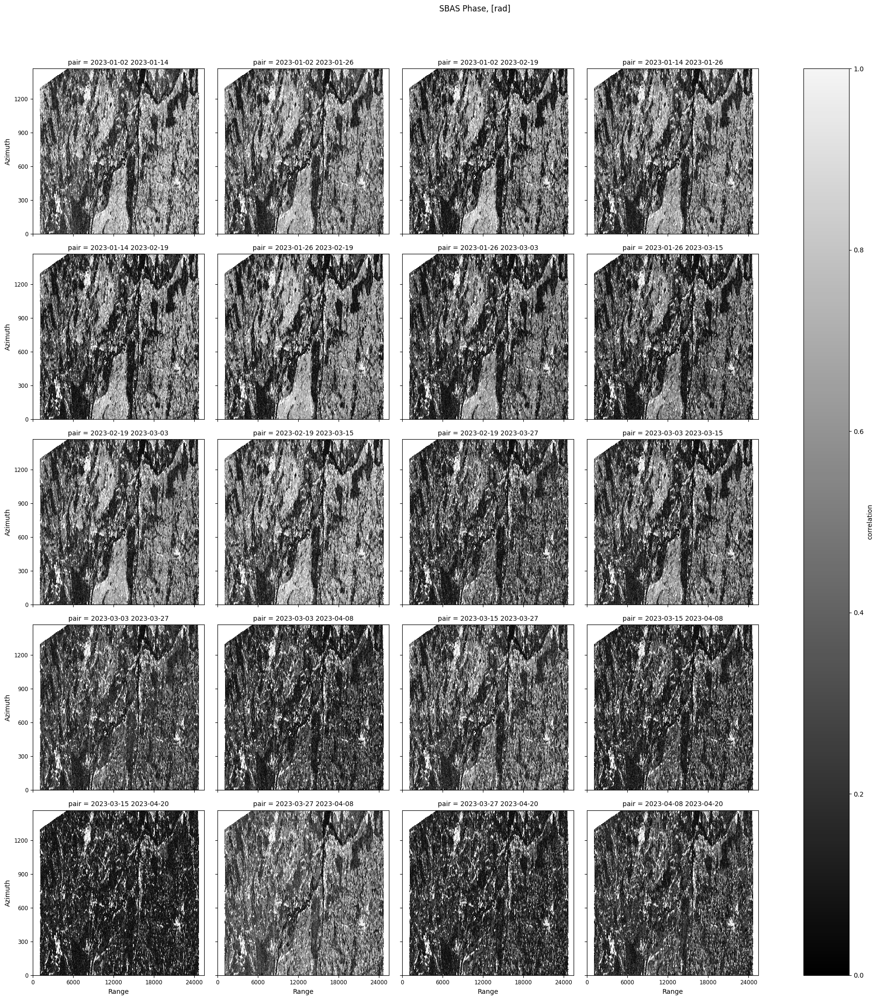

In [28]:
sbas_data.plot_correlations((corr_sbas), caption='SBAS Phase, [rad]')

In [17]:
unwrapp_path = sbas_pipe.config.sbas_uwrapped_impr_path
unwrapp_sbas = sbas_pipe.open_cube_data(unwrapp_path)

2026-02-15 23:35:00 - INFO - DASK client already closed
2026-02-15 23:35:00 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-15 23:35:00 - INFO - DASK client is running


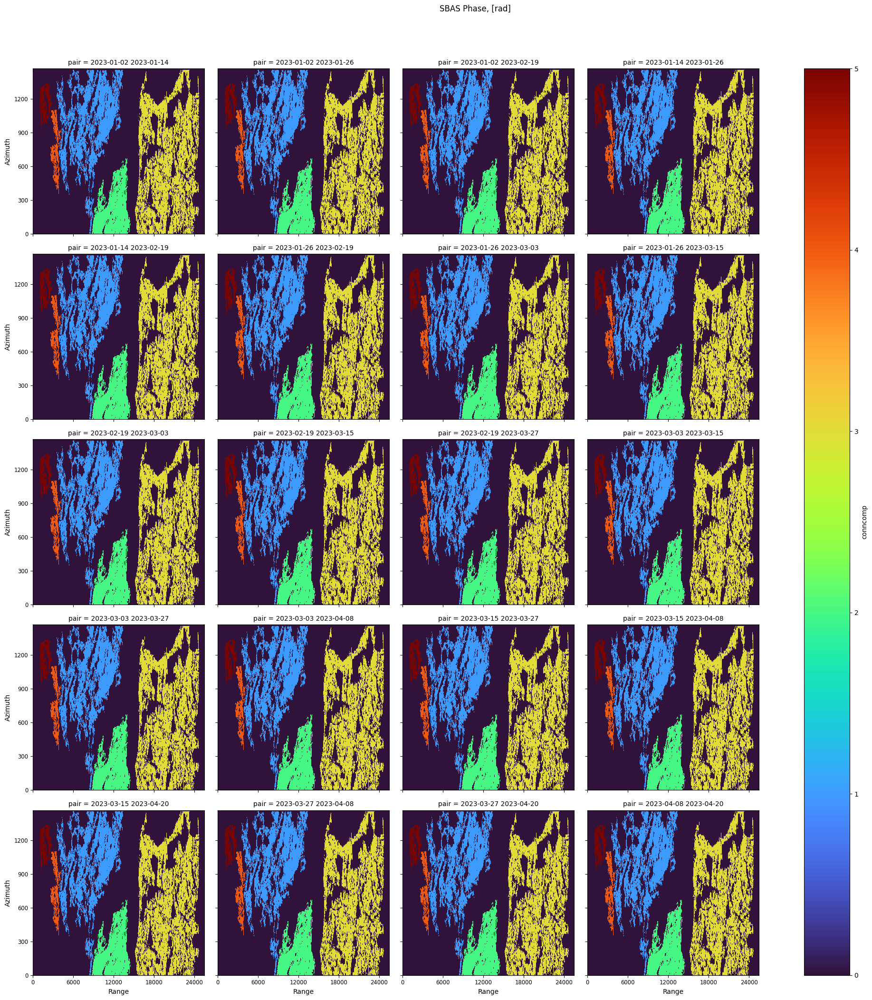

In [22]:
sbas_data.plot_phases((unwrap_sbas_c.conncomp), caption='SBAS Phase, [rad]')

In [6]:
trend_path = sbas_pipe.config.sbas_trend_path
trend_sbas = sbas_pipe.open_cube_data(trend_path)

2026-02-16 00:09:29 - INFO - DASK client already closed
2026-02-16 00:09:29 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-16 00:09:29 - INFO - DASK client is running


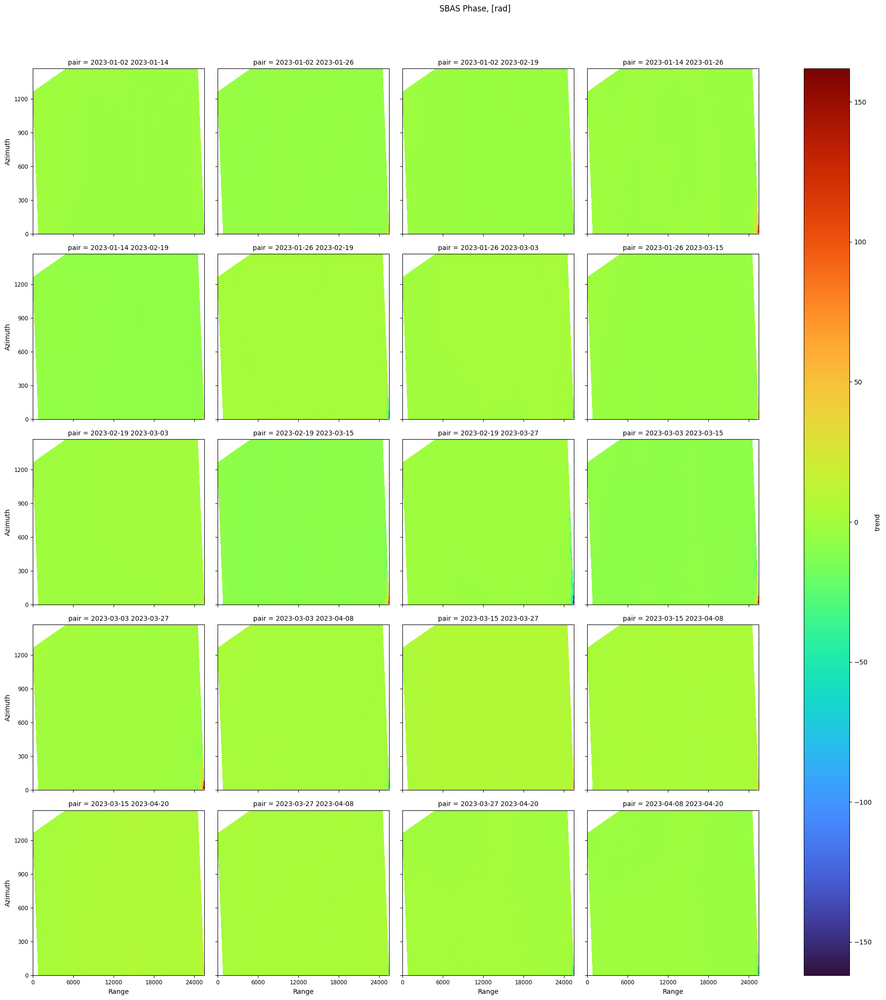

In [7]:
sbas_data.plot_phases((trend_sbas), caption='SBAS Phase, [rad]')

In [7]:
sbas_disp_path = sbas_pipe.config.sbas_disp_path
disp_sbas = sbas_pipe.open_cube_data(sbas_disp_path)

2026-02-16 00:16:07 - INFO - DASK client already closed
2026-02-16 00:16:07 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-16 00:16:08 - INFO - DASK client is running


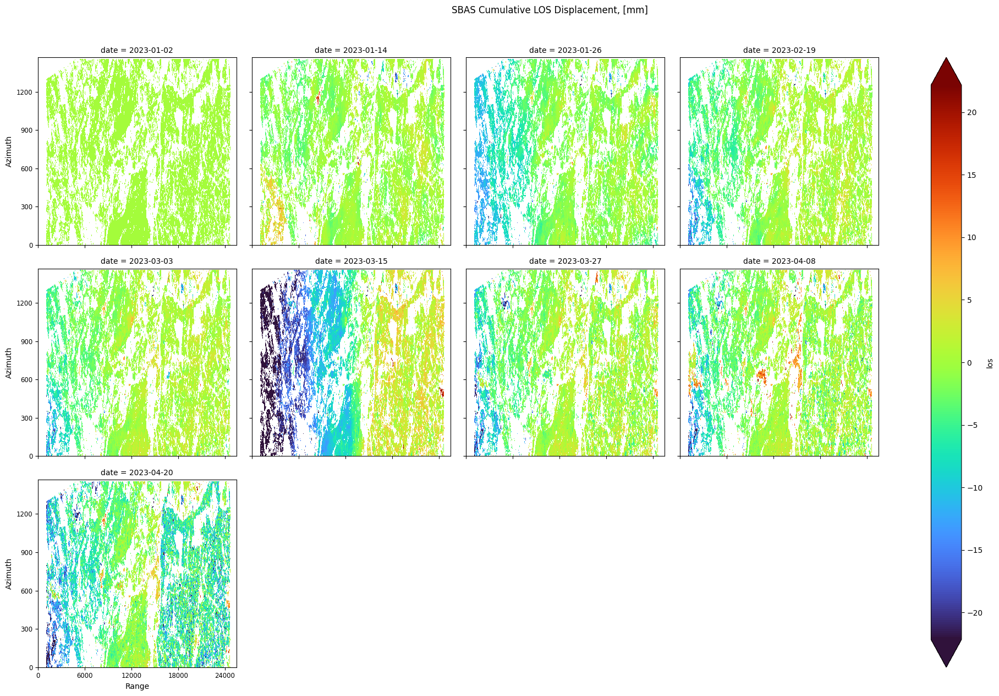

In [8]:
sbas_data.plot_displacements(disp_sbas, caption='SBAS Cumulative LOS Displacement, [mm]',
                        quantile=[0.01, 0.99], symmetrical=True)

In [10]:
sbas_data = sbas_pipe.spec.get_stack(add_dem=True)

Scan data directory for S1 scenes: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download
Initialize S1 Stack with working directory: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/process
Load DEM from /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download/dem.nc


/Users/raf/Dev/code/msg2sar/utils/external/pygmtsar/Stack_dem.py:68: UserWarning: The specified chunks separate the stored chunks along dimension "y" starting at index 512. This could degrade performance. Instead, consider rechunking after loading.
  geoid = xr.open_dataarray(geoid_filename, engine=self.netcdf_engine, chunks=self.netcdf_chunksize).rename({'y': 'lat', 'x': 'lon'})
/Users/raf/Dev/code/msg2sar/utils/external/pygmtsar/Stack_dem.py:68: UserWarning: The specified chunks separate the stored chunks along dimension "x" starting at index 512. This could degrade performance. Instead, consider rechunking after loading.
  geoid = xr.open_dataarray(geoid_filename, engine=self.netcdf_engine, chunks=self.netcdf_chunksize).rename({'y': 'lat', 'x': 'lon'})


Save DEM on WGS84 Ellipsoid:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

2026-02-15 23:10:17 - INFO - SBAS-STACK initialized


In [12]:
 t_r = sbas_pipe.spec.spec.get("trend_resolution", sbas_pipe.trend_resolution)
 sbas_corr_path = sbas_pipe.config.sbas_corr_path
 sbas_uwrapped_impr_path = sbas_pipe.config.sbas_uwrapped_impr_path
 sbas_trend_path = sbas_pipe.config.sbas_trend_path
 corr_sbas = sbas_pipe.open_cube_data(sbas_corr_path)
 unwrap_sbas_c = sbas_pipe.open_cube_data(sbas_uwrapped_impr_path)

2026-02-15 23:11:07 - INFO - Closing DASK client
2026-02-15 23:11:07 - INFO - DASK client closed
2026-02-15 23:11:07 - INFO - DASK client already closed
2026-02-15 23:11:07 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-15 23:11:08 - INFO - DASK client is running
2026-02-15 23:11:08 - INFO - Closing DASK client
2026-02-15 23:11:08 - INFO - DASK client closed
2026-02-15 23:11:08 - INFO - DASK client already closed
2026-02-15 23:11:08 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-15 23:11:08 - INFO - DASK client is running


In [14]:
sbas_pipe.dask_manager.close_client()

2026-02-15 23:11:28 - INFO - Closing DASK client
2026-02-15 23:11:28 - INFO - DASK client closed


In [17]:
# Function to find the mode (most frequent value)
unwrap_sbas_m = sbas_data.conncomp_main(unwrap_sbas_c, 1)
# Trend estimation
decimator_sbas = sbas_data.decimator(resolution=t_r, grid=(1,1))
topo = decimator_sbas(sbas_data.get_topo())
yy, xx = xr.broadcast(topo.y, topo.x)

In [30]:
sbas_pipe.dask_manager.start_client()
trend_sbas_m = sbas_data.regression(unwrap_sbas_m.phase,
        [
            topo,
            topo * yy,
            topo * xx,
            topo * yy * xx,
            topo ** 2,
            topo ** 2 * yy,
            topo ** 2 * xx,
            topo ** 2 * yy * xx,
            yy,
            xx,
            yy * xx
        ], corr_sbas
)
trend_sbas_m.name = 'trend'
sbas_pipe.dask_manager.close_client()

2026-02-15 23:20:24 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-15 23:20:25 - INFO - DASK client is running


NOTE: shapes of variables slices [(1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369)] and data slice (1468, 6369) differ.


2026-02-15 23:20:26 - INFO - Closing DASK client
2026-02-15 23:20:26 - INFO - DASK client closed


In [31]:
sbas_pipe.dask_manager.start_client()
sbas_pipe.save_cube_data(trend_sbas_m, sbas_trend_path)
sbas_pipe.dask_manager.close_client()

2026-02-15 23:21:06 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-15 23:21:06 - INFO - DASK client is running


Saving NetCDF 2D/3D Dataset:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

2026-02-15 23:21:16 - INFO - Closing DASK client
2026-02-15 23:21:16 - INFO - DASK client closed


In [27]:
trend_sbas_m

<xarray.DataArray (pair: 20, y: 1468, x: 6369)> Size: 748MB
dask.array<transpose, shape=(20, 1468, 6369), dtype=float32, chunksize=(1, 1468, 2048), chunktype=numpy.ndarray>
Coordinates:
    ref      (pair) datetime64[ns] 160B 2023-01-02 2023-01-02 ... 2023-04-08
    rep      (pair) datetime64[ns] 160B 2023-01-14 2023-01-26 ... 2023-04-20
  * pair     (pair) <U21 2kB '2023-01-02 2023-01-14' ... '2023-04-08 2023-04-20'
  * y        (y) float64 12kB 0.5 1.5 2.5 3.5 ... 1.466e+03 1.466e+03 1.468e+03
  * x        (x) float64 51kB 2.0 6.0 10.0 ... 2.547e+04 2.547e+04 2.547e+04

In [28]:
sbas_pipe.save_cube_data(trend_sbas_m, 'bogo_pl_trend_sbas.nc')

Saving NetCDF 2D/3D Dataset:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [26]:
sbas_pipe.run_process(sbas_pipe.trend)

2026-02-13 22:56:23 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-13 22:56:24 - INFO - DASK client is running


Scan data directory for S1 scenes: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download
Initialize S1 Stack with working directory: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/process
Load DEM from /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download/dem.nc


Save DEM on WGS84 Ellipsoid:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

2026-02-13 22:56:24 - INFO - SBAS-STACK initialized
2026-02-13 22:56:24 - INFO - Loading data
2026-02-13 22:56:24 - INFO - Closing DASK client
2026-02-13 22:56:24,956 - distributed.scheduler - ERROR - 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/msg2sar/lib/python3.12/site-packages/distributed/utils.py", line 832, in wrapper
    return await func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/envs/msg2sar/lib/python3.12/site-packages/distributed/scheduler.py", line 7578, in feed
    await asyncio.sleep(interval)
  File "/opt/anaconda3/envs/msg2sar/lib/python3.12/asyncio/tasks.py", line 665, in sleep
    return await future
           ^^^^^^^^^^^^
asyncio.exceptions.CancelledError
2026-02-13 22:56:24 - INFO - DASK client closed
2026-02-13 22:56:24 - INFO - DASK client already closed
2026-02-13 22:56:24 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-13 22:56:25 - INFO - DASK client is running
2026-02-13 22:56

NOTE: shapes of variables slices [(1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369), (1469, 6369)] and data slice (1468, 6369) differ.


2026-02-13 22:56:27 - INFO - Saving trend data


ValueError: Forward slashes '/' are not allowed in variable and dimension names (got '/Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/process/bogo_pl_trend_sbas.nc'). Forward slashes are used as hierarchy-separators for HDF5-based files ('netcdf4'/'h5netcdf').

In [3]:
sbas_pipe = SbasProcess(config_path)

2026-01-24 13:44:00 - INFO - SBAS-CONFIG initialized with: 
 AOI-{'type': 'Feature', 'properties': {'id': 1, 'aoiName': 'bogo_pl'}, 'geometry': {'type': 'MultiPolygon', 'coordinates': [[[[20.64924353407008, 52.66160342607914], [21.848247196645833, 52.54707896324363], [21.83294055248267, 52.38682741559186], [20.633936889906916, 52.50135187842737], [20.64924353407008, 52.66160342607914]]]]}} 
REFERENCE-2023-02-19 
DOWNLOAD_DIR-/Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download 
PROCESS_DIR-/Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/process 
DEM_PATH-/Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download/dem.nc 



In [4]:
ds_sbas = sbas.open_stack('intf_mlook')

NameError: name 'sbas' is not defined

In [9]:
process_path = '/Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/process'
uwrapped_cube_path = os.path.join(process_path, 'bogo_pl_uwrapped_sbas.nc')
sbas_phs_cube_path = os.path.join(process_path, 'bogo_pl_phase_sbas.nc')
sbas_tre_cube_path = os.path.join(process_path, 'bogo_pl_trend_sbas.nc')
landmask_cube_path = os.path.join(process_path, 'bogo_pl_landmask.nc')

In [13]:
sbas = sbas_pipe.run_process(sbas_pipe.spec.get_stack, dict(add_dem=True))

2026-02-15 23:31:57 - INFO - Closing DASK client
2026-02-15 23:31:58 - INFO - DASK client closed
2026-02-15 23:31:58 - INFO - Starting DASK client with 1 workers and 30GiB memory limit
2026-02-15 23:31:58 - INFO - DASK client is running


Scan data directory for S1 scenes: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download
Initialize S1 Stack with working directory: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/process
Load DEM from /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download/dem.nc


Save DEM on WGS84 Ellipsoid:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

2026-02-15 23:31:59 - INFO - SBAS-STACK initialized
2026-02-15 23:31:59 - INFO - Closing DASK client
2026-02-15 23:31:59,100 - distributed.scheduler - ERROR - 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/msg2sar/lib/python3.12/site-packages/distributed/utils.py", line 832, in wrapper
    return await func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/envs/msg2sar/lib/python3.12/site-packages/distributed/scheduler.py", line 7578, in feed
    await asyncio.sleep(interval)
  File "/opt/anaconda3/envs/msg2sar/lib/python3.12/asyncio/tasks.py", line 665, in sleep
    return await future
           ^^^^^^^^^^^^
asyncio.exceptions.CancelledError
2026-02-15 23:31:59 - INFO - DASK client closed


In [10]:
sar_io = IO()

In [11]:
land = sar_io.open_cube(landmask_cube_path)

In [23]:
unwrap = sar_io.open_cube(uwrapped_cube_path)

In [9]:
phase = sar_io.open_cube(sbas_phs_cube_path)

In [10]:
phase

<xarray.DataArray 'phase' (pair: 20, y: 1468, x: 6369)> Size: 748MB
dask.array<xarray-phase, shape=(20, 1468, 6369), dtype=float32, chunksize=(1, 1468, 2048), chunktype=numpy.ndarray>
Coordinates:
    ref      (pair) datetime64[ns] 160B dask.array<chunksize=(1,), meta=np.ndarray>
    rep      (pair) datetime64[ns] 160B dask.array<chunksize=(1,), meta=np.ndarray>
  * pair     (pair) <U21 2kB '2023-01-02 2023-01-14' ... '2023-04-08 2023-04-20'
  * y        (y) float64 12kB 0.5 1.5 2.5 3.5 ... 1.466e+03 1.466e+03 1.468e+03
  * x        (x) float64 51kB 2.0 6.0 10.0 ... 2.547e+04 2.547e+04 2.547e+04

In [9]:
data = sar_io.open_cube(uwrapped_cube_path)

In [10]:
data

<xarray.Dataset> Size: 898MB
Dimensions:   (pair: 12, y: 1468, x: 6369)
Coordinates:
    ref       (pair) datetime64[ns] 96B dask.array<chunksize=(1,), meta=np.ndarray>
    rep       (pair) datetime64[ns] 96B dask.array<chunksize=(1,), meta=np.ndarray>
  * pair      (pair) <U21 1kB '2023-01-02 2023-01-26' ... '2023-04-08 2023-04...
  * y         (y) float64 12kB 0.5 1.5 2.5 3.5 ... 1.466e+03 1.466e+03 1.468e+03
  * x         (x) float64 51kB 2.0 6.0 10.0 ... 2.547e+04 2.547e+04 2.547e+04
Data variables:
    phase     (pair, y, x) float32 449MB dask.array<chunksize=(1, 1468, 2048), meta=np.ndarray>
    conncomp  (pair, y, x) float32 449MB dask.array<chunksize=(1, 1468, 2048), meta=np.ndarray>

In [11]:
data.phase

<xarray.DataArray 'phase' (pair: 12, y: 1468, x: 6369)> Size: 449MB
dask.array<xarray-phase, shape=(12, 1468, 6369), dtype=float32, chunksize=(1, 1468, 2048), chunktype=numpy.ndarray>
Coordinates:
    ref      (pair) datetime64[ns] 96B dask.array<chunksize=(1,), meta=np.ndarray>
    rep      (pair) datetime64[ns] 96B dask.array<chunksize=(1,), meta=np.ndarray>
  * pair     (pair) <U21 1kB '2023-01-02 2023-01-26' ... '2023-04-08 2023-04-20'
  * y        (y) float64 12kB 0.5 1.5 2.5 3.5 ... 1.466e+03 1.466e+03 1.468e+03
  * x        (x) float64 51kB 2.0 6.0 10.0 ... 2.547e+04 2.547e+04 2.547e+04

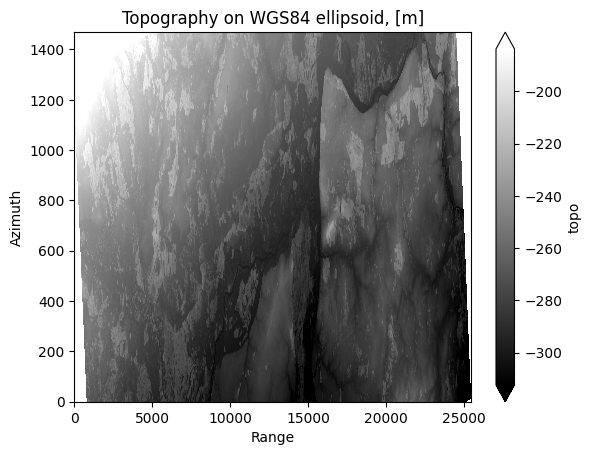

In [11]:
sbas.plot_topo(quantile=[0.01, 0.99])

In [25]:
psmask_sbas = sbas_data.multilooking(sbas_data.psfunction(), coarsen=(1,4), wavelength=ps_sw) > 0.6


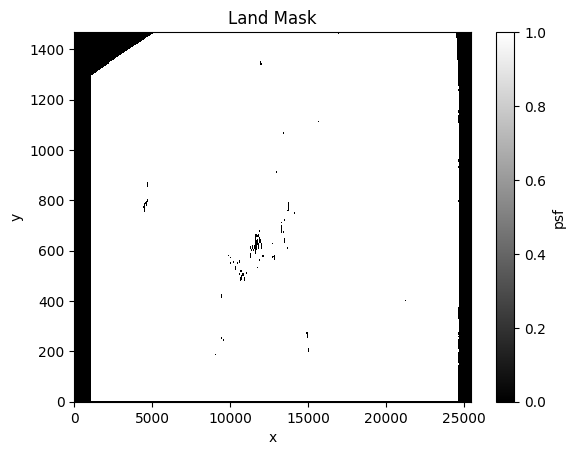

In [14]:
sbas.plot_landmask(land)

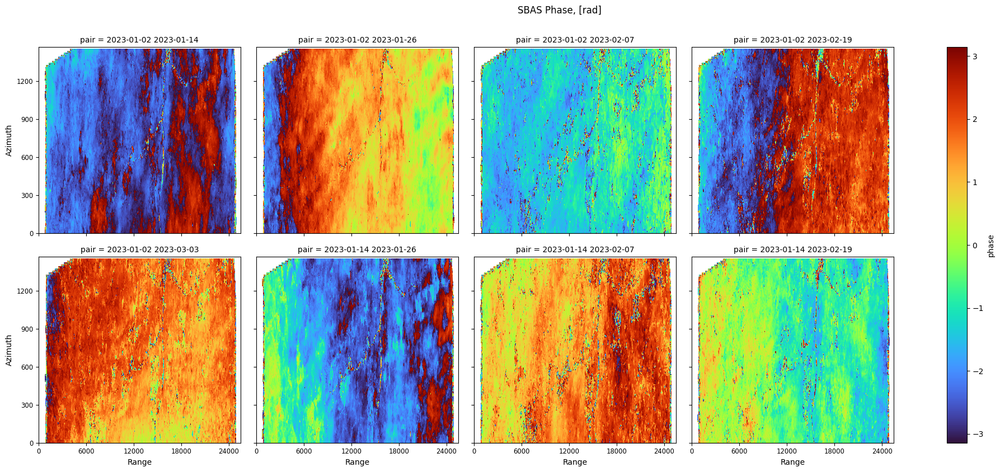

In [18]:
sbas.plot_phases((ds_sbas.phase)[:8], caption='SBAS Phase, [rad]')

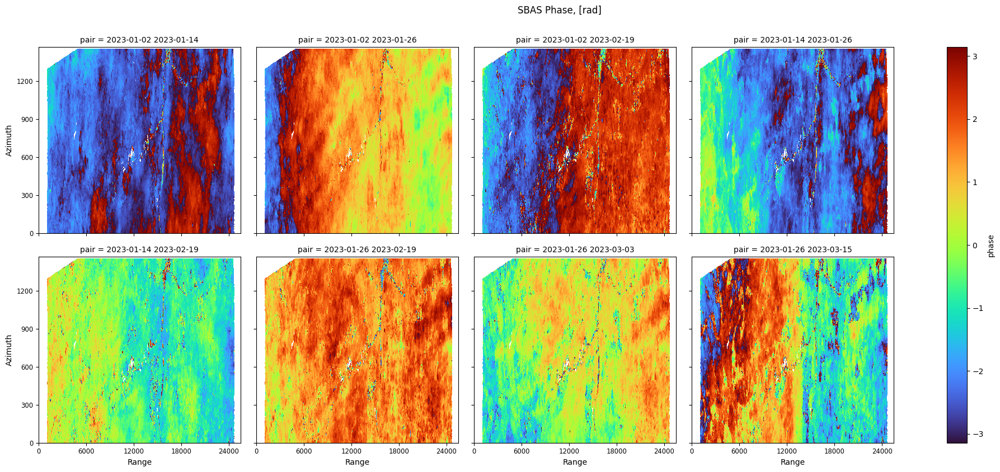

In [18]:
sbas.plot_phases((phase)[:8], caption='SBAS Phase, [rad]')

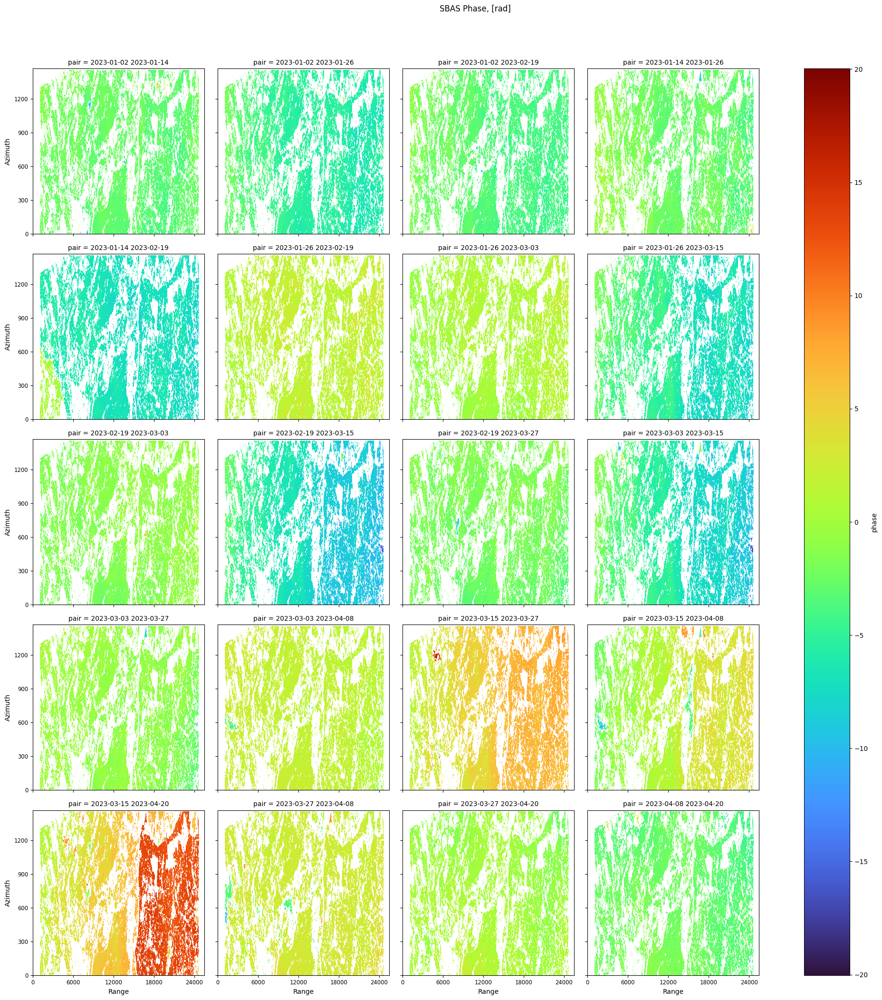

In [24]:
sbas.plot_phases((unwrap.phase), caption='SBAS Phase, [rad]')

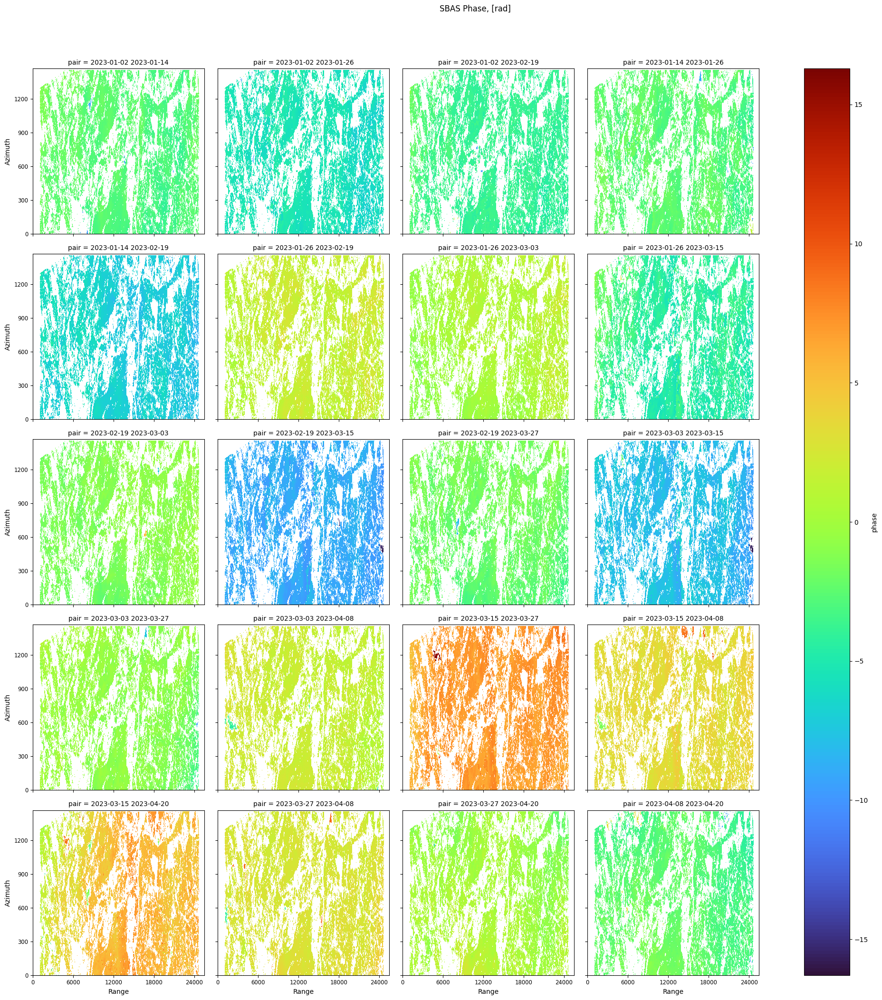

In [22]:
sbas.plot_phases((unwrap_c.phase), caption='SBAS Phase, [rad]')

In [18]:
unwrap_c = unwrap.copy()

In [20]:

for k in range(unwrap.phase.shape[0]):
    print(k)
    unwrap_c.phase[k] = shift_minor_modes(unwrap.phase[k])

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


In [ ]:
sbas.plot_landmask(landmask_sbas)

In [11]:
d = unwrap.phase[4]

In [13]:
dd = shift_minor_modes(d)

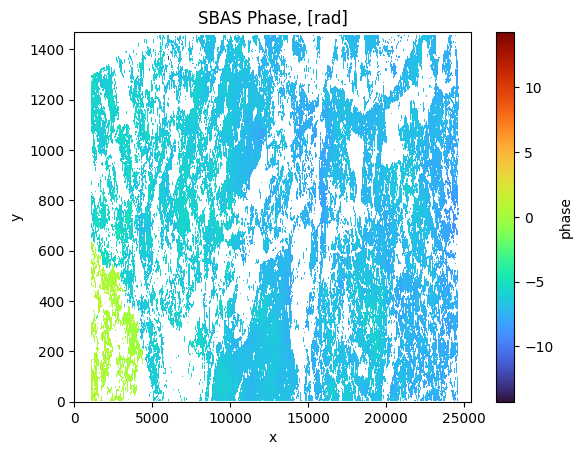

In [12]:
sbas.plot_phase((d), caption='SBAS Phase, [rad]')

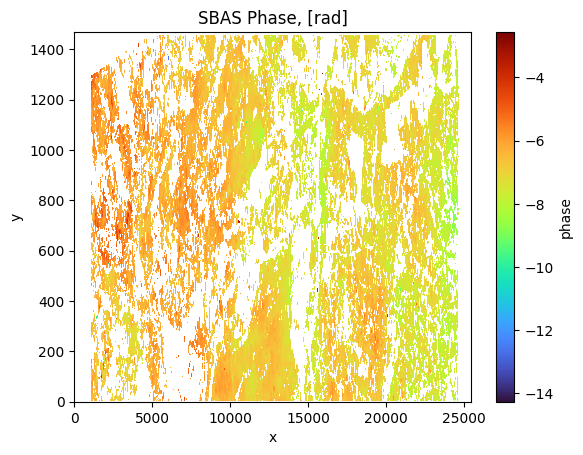

In [14]:
sbas.plot_phase((dd), caption='SBAS Phase, [rad]')

In [163]:
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import xarray as xr

In [131]:
d_ma = ma.masked_invalid(d.values)

In [ ]:
def shift_minor_modes(data: xr.DataArray, modes: list) -> xr.DataArray:
    
    modality = analyze_modality(data.values[np.isfinite(data.values)])
    d_ma = ma.masked_invalid(data.values)

    distances = []
    for mode in modality['modes']:
        distances.append(np.abs(d_ma - mode))

    d_gr = np.argmin(distances, axis=0)
    d_gr_ma = ma.masked_array(d_gr, mask=d_ma.mask)

    ids = list(range(len(modes)))
    count = np.array([np.size(d_gr_ma[d_gr_ma == i]) for i in ids])

    mode_big_idx = np.argmax(count)
    mode_big = modes[mode_big_idx]
    
    dn_ma = np.copy(d_ma)
    for i, mode in enumerate(modes):
        if i != mode_big_idx:
            mode_dis = mode_big - mode
            idx = np.argwhere(d_gr_ma == i)
            dn_ma[idx[:, 0], idx[:, 1]] += mode_dis

    dn_ma = ma.masked_array(dn_ma, mask=d_ma.mask)

    dn_ma_fill = dn_ma.filled(np.nan)  # masked values become np.nan

    # Convert to xarray
    dn_xr = xr.DataArray(dn_ma_fill, dims=("x", "y"))
    data_n = data.copy()

    data_n.values = dn_xr
    data_n_chunk = data_n.chunk(data.data.chunks)

    return data_n_chunk

In [127]:
modality = analyze_modality(d.values[np.isfinite(d.values)])

In [128]:
modes = modality['modes']


In [134]:
distances = []
for mode in modality['modes']:
    distances.append(np.abs(d_ma - mode))

In [139]:
d_gr = np.argmin(distances, axis=0)

In [140]:
d_gr

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], shape=(1468, 6369))

In [143]:
d_gr_ma = ma.masked_array(d_gr, mask=d_ma.mask)

In [147]:
ids = list(range(len(modes)))
count = np.array([np.size(d_gr_ma[d_gr_ma == i]) for i in ids])

In [155]:
mode_big_idx = np.argmax(count)
mode_big = modes[mode_big_idx]

dn_ma = np.copy(d_ma)
for i, mode in enumerate(modes):
    if i != mode_big_idx:
        mode_dis = mode_big - mode
        idx = np.argwhere(d_gr_ma == i)
        dn_ma[idx[:, 0], idx[:, 1]] += mode_dis

In [161]:
dn_ma = ma.masked_array(dn_ma, mask=d_ma.mask)

In [164]:
dn_ma_fill = dn_ma.filled(np.nan)  # masked values become np.nan

# Convert to xarray
dn_xr = xr.DataArray(dn_ma_fill, dims=("x", "y"))

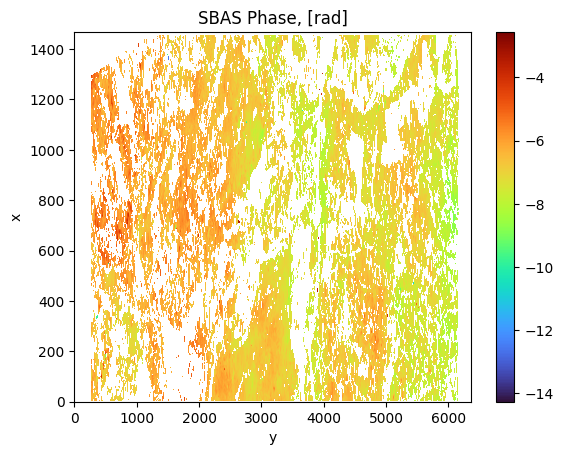

In [165]:
sbas.plot_phase((dn_xr), caption='SBAS Phase, [rad]')

In [176]:
d.data.chunks

((1468,), (2048, 2048, 2048, 225))

In [171]:
dd = d.copy()

In [172]:
dd.values = dn_xr

In [177]:
dd_chunk = dd.chunk(d.data.chunks)

/var/folders/x8/dtcd775x1p71zpy916cxgdnm0000gn/T/ipykernel_53891/2346343364.py:1: DeprecationWarning: Supplying chunks as dimension-order tuples is deprecated. It will raise an error in the future. Instead use a dict with dimension names as keys.
  dd_chunk = dd.chunk(d.data.chunks)


In [178]:
dd_chunk

<xarray.DataArray 'phase' (y: 1468, x: 6369)> Size: 37MB
dask.array<xarray-<this-array>, shape=(1468, 6369), dtype=float32, chunksize=(1468, 2048), chunktype=numpy.ndarray>
Coordinates:
    ref      datetime64[ns] 8B dask.array<chunksize=(), meta=np.ndarray>
    rep      datetime64[ns] 8B dask.array<chunksize=(), meta=np.ndarray>
    pair     <U21 84B '2023-01-14 2023-02-19'
  * y        (y) float64 12kB 0.5 1.5 2.5 3.5 ... 1.466e+03 1.466e+03 1.468e+03
  * x        (x) float64 51kB 2.0 6.0 10.0 ... 2.547e+04 2.547e+04 2.547e+04

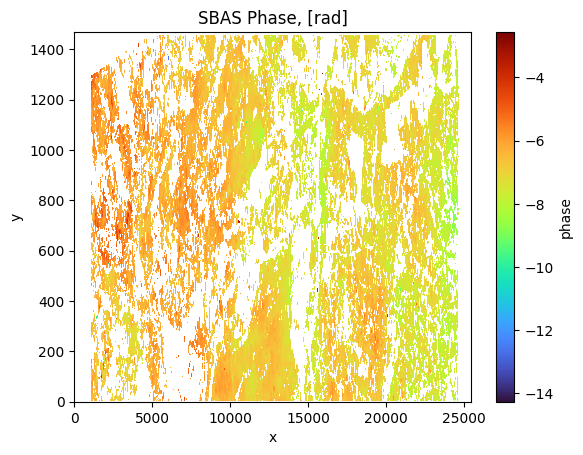

In [179]:
sbas.plot_phase((dd_chunk), caption='SBAS Phase, [rad]')

In [174]:
dd

<xarray.DataArray 'phase' (y: 1468, x: 6369)> Size: 37MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]],
      shape=(1468, 6369), dtype=float32)
Coordinates:
    ref      datetime64[ns] 8B dask.array<chunksize=(), meta=np.ndarray>
    rep      datetime64[ns] 8B dask.array<chunksize=(), meta=np.ndarray>
    pair     <U21 84B '2023-01-14 2023-02-19'
  * y        (y) float64 12kB 0.5 1.5 2.5 3.5 ... 1.466e+03 1.466e+03 1.468e+03
  * x        (x) float64 51kB 2.0 6.0 10.0 ... 2.547e+04 2.547e+04 2.547e+04

In [15]:
dv = d.values[np.isfinite(d.values)]

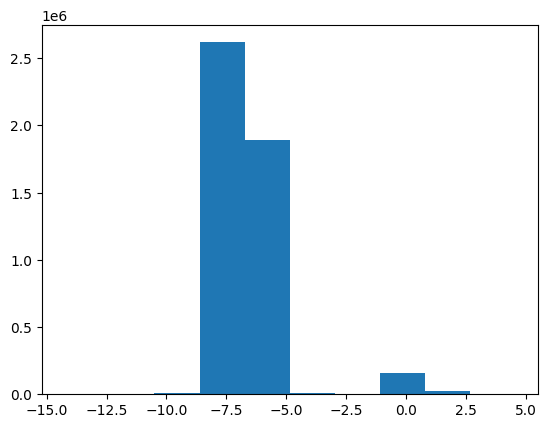

In [16]:
plt.hist(dv)
plt.show()

In [17]:
import numpy as np
from scipy.stats import gaussian_kde
from scipy.signal import find_peaks

def analyze_modality(data, bandwidth=None, grid_size=1000, prominence=0.01):
    """
    Determine if a distribution is unimodal or multimodal and find modal values.

    Parameters
    ----------
    data : array-like
        1D numeric data
    bandwidth : float or None
        KDE bandwidth. If None, Scott's rule is used.
    grid_size : int
        Number of points to evaluate KDE
    prominence : float
        Minimum prominence of peaks (controls sensitivity)

    Returns
    -------
    result : dict
        {
            'modality': 'unimodal' or 'multimodal',
            'num_modes': int,
            'modes': list of floats
        }
    """

    data = np.asarray(data)

    # KDE
    kde = gaussian_kde(data, bw_method=bandwidth)

    x_grid = np.linspace(data.min(), data.max(), grid_size)
    density = kde(x_grid)

    # Find peaks
    peaks, properties = find_peaks(density, prominence=prominence)

    modes = x_grid[peaks]
    num_modes = len(modes)

    modality = "unimodal" if num_modes == 1 else "multimodal"

    return {
        "modality": modality,
        "num_modes": num_modes,
        "modes": modes.tolist()
    }


In [18]:
results = analyze_modality(dv)

In [19]:
results

{'modality': 'multimodal',
 'num_modes': 2,
 'modes': [-6.879487037658691, 0.2409801483154297]}

In [44]:
def assign_modes_ordered(data, modes):
    """
    Assign each data point to nearest mode (order preserved).
    """
    data = np.asarray(data)
    modes = np.asarray(modes)

    distances = np.abs(data[:, None] - modes[None, :])
    assignments = np.argmin(distances, axis=1)

    return assignments

In [109]:
def shift_minor_modes(data, modes):
    
    group_ids = assign_modes_ordered(data, modes)
    ids = list(range(len(modes)))
    count = np.array([np.size(group_ids[group_ids == i]) for i in ids])
    mode_big_idx = np.argmax(count)
    mode_big = modes[mode_big_idx]
    
    data_n = np.copy(data)
    for i, mode in enumerate(modes):
        if i != mode_big_idx:
            mode_dis = mode_big - mode
            idx = np.argwhere(group_ids == i)
            data_n[idx] += mode_dis

    return data_n

In [55]:
if 0 == mode_big:
    print(1)

1


In [56]:
[mode_big]

-6.879487037658691

In [110]:
shift_minor_modes(dv, results['modes'])

[4524988  185794]


array([-6.1331067, -6.159828 , -6.220569 , ..., -7.1169596, -7.1430464,
       -7.176236 ], shape=(4710782,), dtype=float32)

In [52]:
ids

[0, 1]

In [59]:
dvn = mode_based_grouping(dv, results)

In [30]:
dvn

[array([-6.252143 , -6.244252 , -6.228539 , ..., -7.1169596, -7.1430464,
        -7.176236 ], shape=(4524988,), dtype=float32),
 array([ 0.98736054,  0.96063906,  0.8998981 , ..., -3.193588  ,
        -3.1712358 , -1.745132  ], shape=(185794,), dtype=float32)]

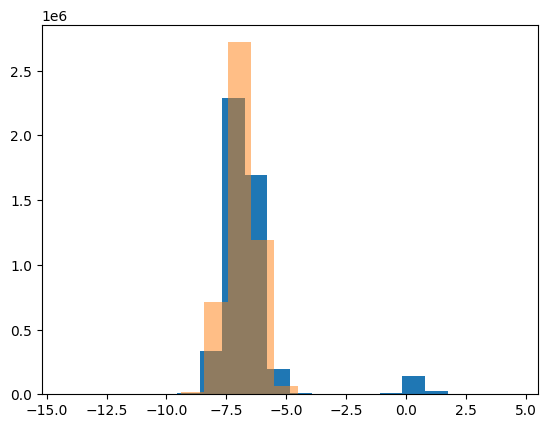

In [68]:
plt.hist(dv, bins=20)
plt.hist(dvn, alpha=0.5, bins=12)
plt.show()

In [20]:
d5 = unwrap.phase[5]

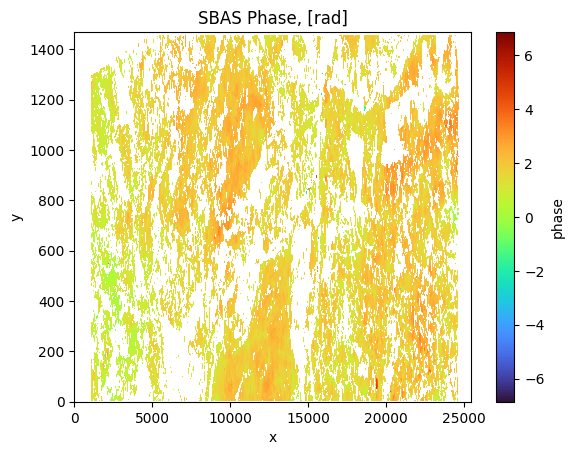

In [21]:
sbas.plot_phase((d5), caption='SBAS Phase, [rad]')

In [24]:
d5v = d5.values[np.isfinite(d5.values)]

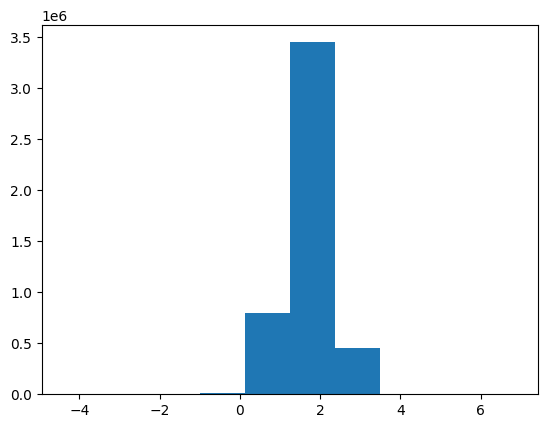

In [25]:
plt.hist(d5v)
plt.show()

In [26]:
results5 = analyze_modality(d5v)
results5

{'modality': 'unimodal', 'num_modes': 1, 'modes': [1.753852367401123]}

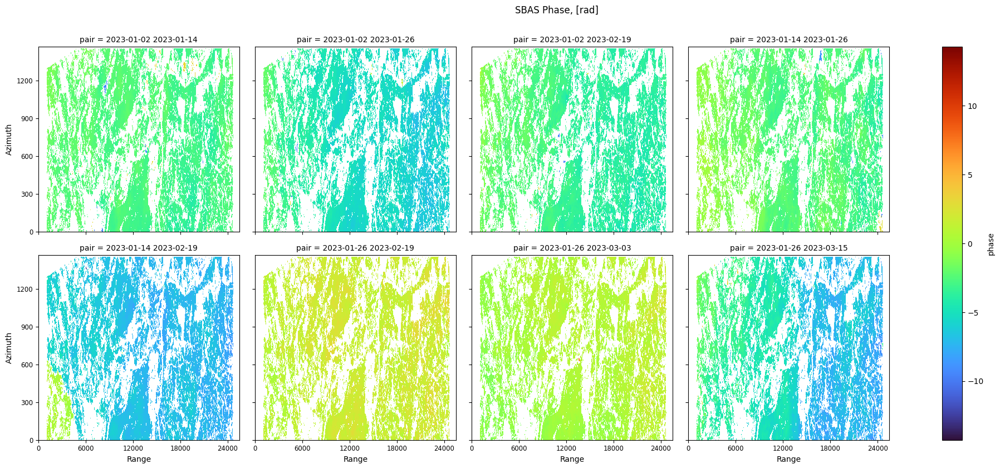

In [25]:
sbas.plot_phases((unwrap.phase)[:8], caption='SBAS Phase, [rad]')

In [21]:
data.isel(pair=0)

<xarray.Dataset> Size: 75MB
Dimensions:   (y: 1468, x: 6369)
Coordinates:
    ref       datetime64[ns] 8B dask.array<chunksize=(), meta=np.ndarray>
    rep       datetime64[ns] 8B dask.array<chunksize=(), meta=np.ndarray>
    pair      <U21 84B '2023-01-02 2023-01-26'
  * y         (y) float64 12kB 0.5 1.5 2.5 3.5 ... 1.466e+03 1.466e+03 1.468e+03
  * x         (x) float64 51kB 2.0 6.0 10.0 ... 2.547e+04 2.547e+04 2.547e+04
Data variables:
    phase     (y, x) float32 37MB dask.array<chunksize=(1468, 2048), meta=np.ndarray>
    conncomp  (y, x) float32 37MB dask.array<chunksize=(1468, 2048), meta=np.ndarray>

In [4]:
sbas_pipe.dask_manager.close_client()

In [5]:
if 'dask_client' in globals():
    print(True)

In [4]:
sbas_pipe.run_process(sbas_pipe.landmask)

Scan data directory for S1 scenes: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download
Initialize S1 Stack with working directory: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/process
Load DEM from /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download/dem.nc


/Users/raf/Dev/code/msg2sar/utils/external/pygmtsar/Stack_dem.py:68: UserWarning: The specified chunks separate the stored chunks along dimension "y" starting at index 512. This could degrade performance. Instead, consider rechunking after loading.
  geoid = xr.open_dataarray(geoid_filename, engine=self.netcdf_engine, chunks=self.netcdf_chunksize).rename({'y': 'lat', 'x': 'lon'})
/Users/raf/Dev/code/msg2sar/utils/external/pygmtsar/Stack_dem.py:68: UserWarning: The specified chunks separate the stored chunks along dimension "x" starting at index 512. This could degrade performance. Instead, consider rechunking after loading.
  geoid = xr.open_dataarray(geoid_filename, engine=self.netcdf_engine, chunks=self.netcdf_chunksize).rename({'y': 'lat', 'x': 'lon'})


Save DEM on WGS84 Ellipsoid:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

/opt/anaconda3/envs/msg2sar/lib/python3.12/site-packages/dask/core.py:127: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/opt/anaconda3/envs/msg2sar/lib/python3.12/site-packages/distributed/client.py:3157: UserWarning: Sending large graph of size 142.67 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


Saving NetCDF 2D/3D Dataset:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

In [4]:
sbas_pipe.run_process(sbas_pipe.sbas)

Scan data directory for S1 scenes: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download
Initialize S1 Stack with working directory: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/process
Load DEM from /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download/dem.nc


/Users/raf/Dev/code/msg2sar/utils/external/pygmtsar/Stack_dem.py:68: UserWarning: The specified chunks separate the stored chunks along dimension "y" starting at index 512. This could degrade performance. Instead, consider rechunking after loading.
  geoid = xr.open_dataarray(geoid_filename, engine=self.netcdf_engine, chunks=self.netcdf_chunksize).rename({'y': 'lat', 'x': 'lon'})
/Users/raf/Dev/code/msg2sar/utils/external/pygmtsar/Stack_dem.py:68: UserWarning: The specified chunks separate the stored chunks along dimension "x" starting at index 512. This could degrade performance. Instead, consider rechunking after loading.
  geoid = xr.open_dataarray(geoid_filename, engine=self.netcdf_engine, chunks=self.netcdf_chunksize).rename({'y': 'lat', 'x': 'lon'})


Save DEM on WGS84 Ellipsoid:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

2026-01-20 22:13:56,432 - distributed.worker - WARNING - Compute Failed
Key:       open_dataset-ff2b7bdd-8390-43e8-8bfe-2f807b3f74d0
Function:  execute_task
args:      ((<function apply at 0x106394d60>, <function open_dataset at 0x11398f2e0>, ['/Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/process/intf_mlook_20230408_20230420.grd.aux.xml'], (<class 'dict'>, [['engine', 'h5netcdf'], ['chunks', 2048]])))
kwargs:    {}
Exception: "OSError('Unable to synchronously open file (file signature not found)')"



OSError: Unable to synchronously open file (file signature not found)

In [11]:
sbas_pipe.dask_manager.start_client()

In [12]:
landmask_p, sbas_data = sbas_pipe.landmask()

Scan data directory for S1 scenes: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download
Initialize S1 Stack with working directory: /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/process
Load DEM from /Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/download/dem.nc


/Users/raf/Dev/code/msg2sar/utils/external/pygmtsar/Stack_dem.py:68: UserWarning: The specified chunks separate the stored chunks along dimension "y" starting at index 512. This could degrade performance. Instead, consider rechunking after loading.
  geoid = xr.open_dataarray(geoid_filename, engine=self.netcdf_engine, chunks=self.netcdf_chunksize).rename({'y': 'lat', 'x': 'lon'})
/Users/raf/Dev/code/msg2sar/utils/external/pygmtsar/Stack_dem.py:68: UserWarning: The specified chunks separate the stored chunks along dimension "x" starting at index 512. This could degrade performance. Instead, consider rechunking after loading.
  geoid = xr.open_dataarray(geoid_filename, engine=self.netcdf_engine, chunks=self.netcdf_chunksize).rename({'y': 'lat', 'x': 'lon'})


Save DEM on WGS84 Ellipsoid:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

/opt/anaconda3/envs/msg2sar/lib/python3.12/site-packages/dask/core.py:127: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/opt/anaconda3/envs/msg2sar/lib/python3.12/site-packages/distributed/client.py:3157: UserWarning: Sending large graph of size 142.67 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


In [18]:
sbas_pipe.dask_manager.start_client()

In [19]:
io = pygmtsar.IO.IO()

In [20]:
io.save_cube(landmask_p, './landmask_cube.nc')

Saving NetCDF 2D/3D Dataset:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

/opt/anaconda3/envs/msg2sar/lib/python3.12/site-packages/dask/core.py:127: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


In [21]:
sbas_pipe.dask_manager.close_client()

In [23]:
n = io.open_cube('./landmask_cube.nc')

In [24]:
n

<xarray.DataArray 'psf' (y: 1468, x: 6369)> Size: 9MB
dask.array<xarray-psf, shape=(1468, 6369), dtype=bool, chunksize=(1468, 2048), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) float64 12kB 0.5 1.5 2.5 3.5 ... 1.466e+03 1.466e+03 1.468e+03
  * x        (x) float64 51kB 2.0 6.0 10.0 ... 2.547e+04 2.547e+04 2.547e+04

In [13]:
landmask_p

<xarray.DataArray 'psf' (y: 1468, x: 6369)> Size: 9MB
dask.array<isfinite, shape=(1468, 6369), dtype=bool, chunksize=(1468, 2048), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) float64 12kB 0.5 1.5 2.5 3.5 ... 1.466e+03 1.466e+03 1.468e+03
  * x        (x) float64 51kB 2.0 6.0 10.0 ... 2.547e+04 2.547e+04 2.547e+04

In [14]:
dem_path = '/Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/raw/DEM_WGS84.nc'
landmask_path = '/Users/raf/Dev/code/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/raw/landmask.nc'

In [16]:
landmask = riox.open_rasterio(landmask_path)

/opt/anaconda3/envs/msg2sar/lib/python3.12/site-packages/rioxarray/_io.py:1143: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore


In [17]:
landmask

<xarray.DataArray 'psf' (band: 1, y: 1468, x: 6369)> Size: 9MB
[9349692 values with dtype=int8]
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 51kB 0.5 1.5 2.5 ... 6.366e+03 6.368e+03 6.368e+03
  * y            (y) float64 12kB 0.5 1.5 2.5 ... 1.466e+03 1.466e+03 1.468e+03
    spatial_ref  int64 8B 0
Attributes:
    dtype:         bool
    scale_factor:  1.0
    add_offset:    0.0

<xarray.DataArray 'band' ()> Size: 8B
array(1)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0

In [26]:
landmask.band[0]

<xarray.DataArray 'band' ()> Size: 8B
array(1)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0

In [25]:
landmask_ = landmask.band[0].fillna(0)
landmask_.plot.imshow(vmin=0, cmap='binary_r')

TypeError: No numeric data to plot.

In [21]:
landmask_

<xarray.DataArray 'band' (band: 1)> Size: 8B
array([1])
Coordinates:
  * band         (band) int64 8B 1
    spatial_ref  int64 8B 0